In [1]:
from nmon import *

EC_shunt = 0.18

N = 1
M = 2

N_EJN = 20
N_EJM = 20
N_flux = 5

flux_list = np.linspace(0, 0.5, N_flux)
EJM_list = np.linspace(1*EC_shunt, 100*EC_shunt, N_EJN)
EJN_list = np.linspace(1*EC_shunt, 100*EC_shunt, N_EJM)

relative_anharm_list = np.zeros((N_EJM , N_EJN, N_flux))
w01_list = np.zeros((N_EJM , N_EJN, N_flux))
w12_list = np.zeros((N_EJM , N_EJN, N_flux))
w01_variation_list = np.zeros_like(w01_list)

for i in tqdm(range(N_EJM)):
    for j in range(N_EJN):
        nmon = Nmon(N=N, M=M, EJM=EJM_list[i], EJN=EJN_list[j], EC_shunt=EC_shunt)
        for k, flux in enumerate(flux_list):

            w01_local = np.full(2, None)

            nmon.hamiltonian_calc(flux=flux, ng=[0.5, 0.5], num_levels=4)

            relative_anharm_list[i, j, k] = nmon.relative_anharm
            w01_list[i, j, k] = nmon.transition_freqs[0]
            try:
                w12_list[i, j, k] = nmon.transition_freqs[1]
            except Exception as e:
                print(e)
                print(nmon.EC_shunt, nmon.EJN, nmon.EJM, flux, nmon.transition_freqs, nmon.bound_state_energies)
                print()



            w01_local[0] = nmon.transition_freqs[0]
            nmon.hamiltonian_calc(flux=flux, ng=[0.25, 0.75], num_levels=2)
            w01_local[1] = nmon.transition_freqs[0]

            w01_variation_list[i, j, k] = (np.max(w01_local) - np.min(w01_local))/np.min(w01_local)

 80%|████████  | 16/20 [18:48<04:15, 63.76s/it]

list index out of range
0.17570539035367128 7.6831578947368415 15.186315789473683 0.5 [1.974714541313518] [-9.20264945 -9.05198229 -7.63263802 -7.22793491]

list index out of range
0.17544838862454207 8.621052631578946 15.186315789473683 0.5 [1.9460922501111977] [-9.30071687 -9.07269377 -7.42962532 -7.35462462]



 85%|████████▌ | 17/20 [19:50<03:09, 63.19s/it]

list index out of range
0.175320169488467 8.621052631578946 16.12421052631579 0.5 [2.0287224496121468] [-10.31239421 -10.22600109  -8.69809915  -8.28367177]

list index out of range
0.17506429261740566 9.558947368421052 16.12421052631579 0.5 [2.0913501470932783] [-10.47343308 -10.25189427  -8.48940338  -8.38208293]

list index out of range
0.17480916155392462 10.496842105263157 16.12421052631579 0.5 [2.8766388667380323] [-10.91024502 -10.41546402  -8.68365743  -8.03360616]



 90%|█████████ | 18/20 [20:52<02:05, 62.69s/it]

list index out of range
0.17519213762274718 8.621052631578946 17.062105263157893 0.5 [2.5682897707891286] [-11.72460721 -11.37259546 -10.01221424  -9.15631744]

list index out of range
0.1749366340636614 9.558947368421052 17.062105263157893 0.5 [2.1044311878589532] [-11.46218645 -11.42424986  -9.76553343  -9.35775526]

list index out of range
0.17468187468179294 10.496842105263157 17.062105263157893 0.5 [2.2470390261518336] [-11.67163447 -11.46151989  -9.5646289   -9.42459544]

list index out of range
0.1744278562306446 11.434736842105263 17.062105263157893 0.5 [2.9985642545575217] [-12.09066037 -11.6526863   -9.77946271  -9.09209611]



 95%|█████████▌| 19/20 [21:50<01:01, 61.44s/it]

list index out of range
0.17480916155392462 9.558947368421052 18.0 0.5 [2.564475610944889] [-12.83224893 -12.5707129  -11.12545545 -10.26777332]

list index out of range
0.17455477304204664 10.496842105263157 18.0 0.5 [2.197661914275656] [-12.64605559 -12.64292396 -10.83445657 -10.44839367]

list index out of range
0.1743011238447199 11.434736842105263 18.0 0.5 [2.4097177446716387] [-12.89168265 -12.69556397 -10.65389397 -10.4819649 ]

list index out of range
0.1740482107436805 12.372631578947368 18.0 0.5 [3.1219535655233877] [-13.29564062 -12.9097072  -10.88458788 -10.17368705]

list index out of range
0.1737960305393165 13.310526315789472 18.0 0.5 [3.830940279420215] [-13.81790002 -13.23282383 -11.14763185  -9.98695974]



100%|██████████| 20/20 [22:47<00:00, 68.39s/it]


### no need to vary flux!!! it just changes EJ

In [2]:
np.save("./data_arrays/N={}_M={}_EC_shunt={}_EJM_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), EJM_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_EJN_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), EJN_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_flux_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), flux_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_rel_anharm_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), relative_anharm_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_w01_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), w01_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_w01_variation_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), w01_variation_list)


In [88]:
N = 1
M = 2
EC_shunt = 0.18

EJM_list = np.load("./data_arrays/N={}_M={}_EC_shunt={}_EJM_list.npy".format(N, M, round(EC_shunt, 2)))
EJN_list = np.load("./data_arrays/N={}_M={}_EC_shunt={}_EJN_list.npy".format(N, M, round(EC_shunt, 2)))
flux_list = np.load("./data_arrays/N={}_M={}_EC_shunt={}_flux_list.npy".format(N, M, round(EC_shunt, 2)))
relative_anharm_list_flux = np.load("./data_arrays/N={}_M={}_EC_shunt={}_rel_anharm_list.npy".format(N, M, round(EC_shunt, 2)))
w01_list_flux = np.load("./data_arrays/N={}_M={}_EC_shunt={}_w01_list.npy".format(N, M, round(EC_shunt, 2)))
w01_variation_list_flux = np.load("./data_arrays/N={}_M={}_EC_shunt={}_w01_variation_list.npy".format(N, M, round(EC_shunt, 2)))

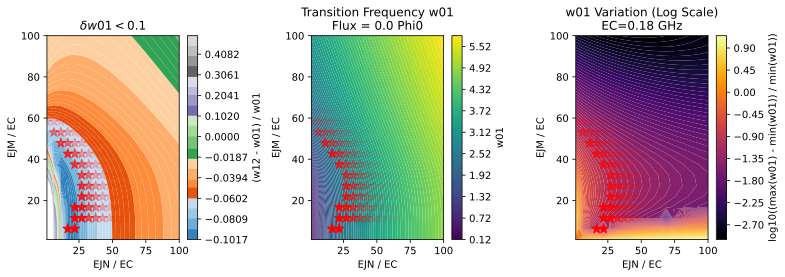

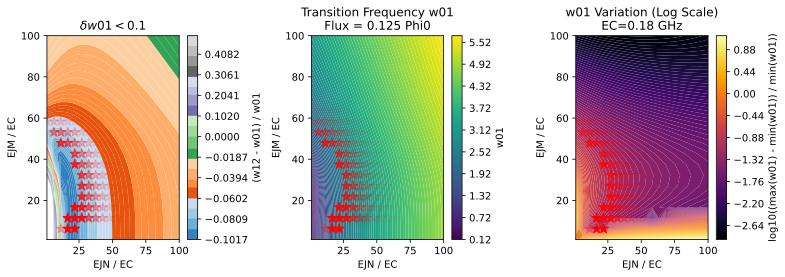

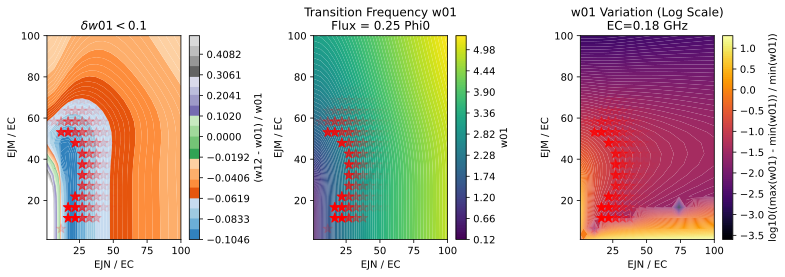

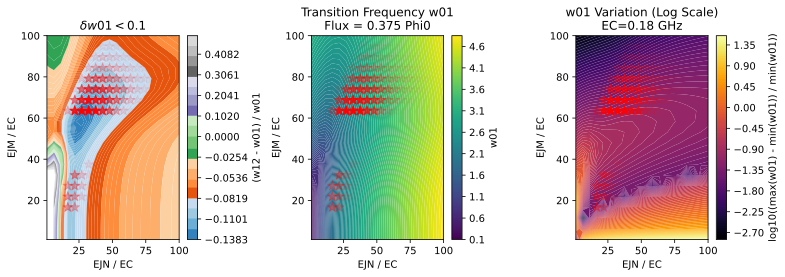

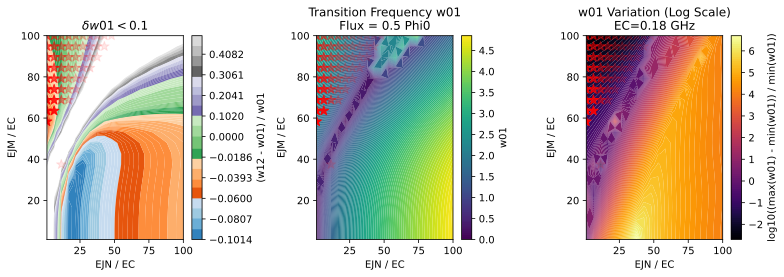

...

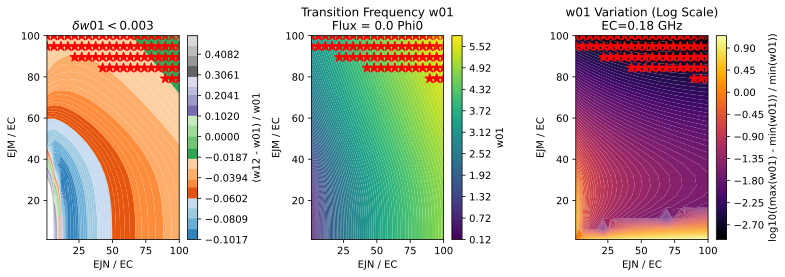

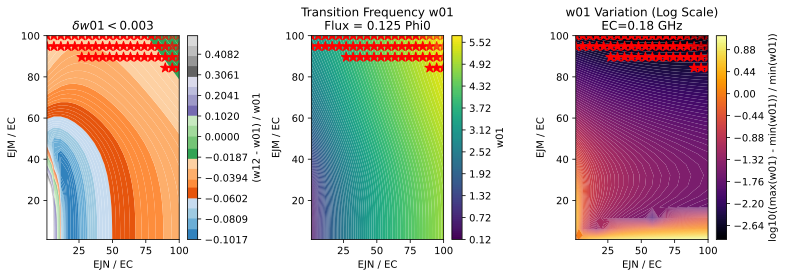

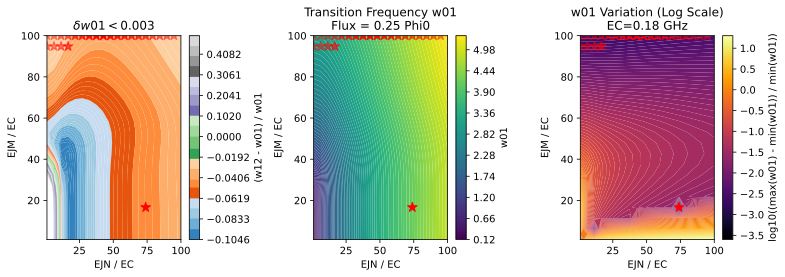

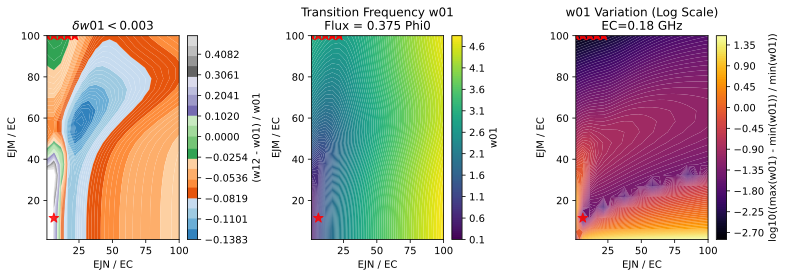

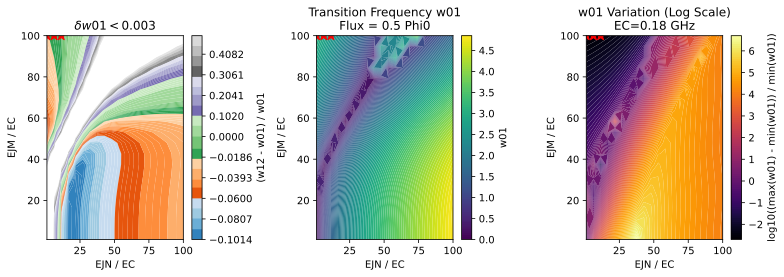

In [98]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors

w01_variation_levels = [1e-1, 1e-2, 10**(-2.5)]

for w01_variation_lev in w01_variation_levels:

    for k, flux_value in enumerate(flux_list):

        EJN_grid, EJM_grid = np.meshgrid(EJN_list, EJM_list)

        # Extract arrays for the current flux value
        relative_anharm_list = relative_anharm_list_flux[:, :, k]
        w01_list = w01_list_flux[:, :, k]
        w01_variation_list = w01_variation_list_flux[:, :, k]

        # Replace NaN values in relative_anharm_list
        relative_anharm_list[np.isnan(relative_anharm_list)] = 1

        # Create DataFrame for all data points
        data = {
            'EJN': EJN_grid.flatten(),
            'EJM': EJM_grid.flatten(),
            'RelativeAnharmonicity': relative_anharm_list.flatten(),
            'w01': w01_list.flatten(),
            'w01Variation': w01_variation_list.flatten()
        }
        df = pd.DataFrame(data)

        # Filter rows where w01Variation < 10^(-1)
        filtered_df = df[df['w01Variation'] < w01_variation_lev]

        # Identify the top N_anharm points (lowest anharmonicity values)
        N_anharm = 100
        best_points = filtered_df.nsmallest(N_anharm, 'RelativeAnharmonicity')

        # Adjust alpha values for star-points
        best_anharm_values = best_points['RelativeAnharmonicity'].values
        alphas = np.ones(N_anharm)
        for i in range(1, N_anharm):
            if abs(best_anharm_values[i] - best_anharm_values[i - 1]) > 1e-3:
                alphas[i:] = np.logspace(0, -2, N_anharm - i)
                break

        # Plot with contourf and overlay star-points
        fig, axes = plt.subplots(1, 3, figsize=(11, 4))

        # First subplot: Relative Anharmonicity
        norm = colors.TwoSlopeNorm(vmin=df['RelativeAnharmonicity'].min(), vcenter=0, vmax=0.5)
        levels = np.concatenate((np.linspace(df['RelativeAnharmonicity'].min(), -1e-5, 50), 
                                np.linspace(0, 0.5, 50)))
        im1 = axes[0].contourf(EJN_grid / EC_shunt, EJM_grid / EC_shunt, 
                            relative_anharm_list, levels=levels, cmap='tab20c', norm=norm)
        fig.colorbar(im1, ax=axes[0], label='(w12 - w01) / w01')
        axes[0].set_title(r"$\delta w01 < {}$".format(round(w01_variation_lev, 3)))
        axes[0].set_xlabel('EJN / EC')
        axes[0].set_ylabel('EJM / EC')

        # Overlay star-points
        axes[0].scatter(best_points['EJN'] / EC_shunt, best_points['EJM'] / EC_shunt, 
                        s=100, c='red', marker='*', alpha=alphas)

        # Second subplot: w01
        im2 = axes[1].contourf(EJN_grid / EC_shunt, EJM_grid / EC_shunt, 
                            w01_list, levels=100, cmap='viridis')
        fig.colorbar(im2, ax=axes[1], label='w01')
        axes[1].set_title(f"Transition Frequency w01\nFlux = {flux_value} Phi0")
        axes[1].set_xlabel('EJN / EC')
        axes[1].set_ylabel('EJM / EC')

        # Overlay star-points
        axes[1].scatter(best_points['EJN'] / EC_shunt, best_points['EJM'] / EC_shunt, 
                        s=100, c='red', marker='*', alpha=alphas)

        # Third subplot: Log10 of w01 Variation
        im3 = axes[2].contourf(EJN_grid / EC_shunt, EJM_grid / EC_shunt, 
                            np.log10(w01_variation_list), levels=100, cmap='inferno')
        fig.colorbar(im3, ax=axes[2], label='log10((max(w01) - min(w01)) / min(w01))')
        axes[2].set_title(f"w01 Variation (Log Scale)\nEC={round(EC_shunt, 2)} GHz")
        axes[2].set_xlabel('EJN / EC')
        axes[2].set_ylabel('EJM / EC')

        # Overlay star-points
        axes[2].scatter(best_points['EJN'] / EC_shunt, best_points['EJM'] / EC_shunt, 
                        s=100, c='red', marker='*', alpha=alphas)

        # Adjust layout and save the figure
        plt.tight_layout()
        plt.savefig(f"./data_figures/N={N}_M={M}_EC={round(EC_shunt, 2)}_flux_{k}_combined_plots.pdf")
        plt.show()


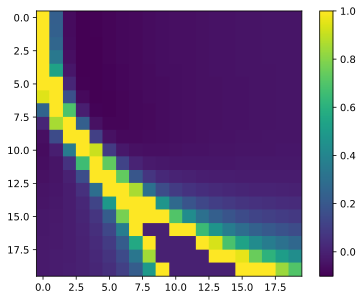

In [79]:
relative_anharm_list[np.where(relative_anharm_list > 1)] = 1

plt.imshow(relative_anharm_list)
plt.colorbar()

In [62]:
relative_anharm_list[np.where(np.isnan(relative_anharm_list))] = 0